In [ ]:
# Copyright 2025 Bytedance Ltd. and/or its affiliates.
# SPDX-License-Identifier: Apache-2.0

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import os
from copy import deepcopy
from typing import (
    Any,
    AsyncIterable,
    Callable,
    Dict,
    Generator,
    List,
    NamedTuple,
    Optional,
    Tuple,
    Union,
)
import requests
from io import BytesIO

from PIL import Image
import torch
from accelerate import infer_auto_device_map, load_checkpoint_and_dispatch, init_empty_weights

from data.transforms import ImageTransform
from data.data_utils import pil_img2rgb, add_special_tokens
from modeling.bagel import (
    BagelConfig, Bagel, Qwen2Config, Qwen2ForCausalLM, SiglipVisionConfig, SiglipVisionModel
)
from modeling.qwen2 import Qwen2Tokenizer
from modeling.bagel.qwen2_navit import NaiveCache
from modeling.autoencoder import load_ae
from safetensors.torch import load_file

## Model Initialization

In [ ]:
model_path = "/home/aiscuser/ThinkMorph/merged_dropout" 

# LLM config preparing
llm_config = Qwen2Config.from_json_file(os.path.join(model_path, "llm_config.json"))
llm_config.qk_norm = True
llm_config.tie_word_embeddings = False
llm_config.layer_module = "Qwen2MoTDecoderLayer"

# ViT config preparing
vit_config = SiglipVisionConfig.from_json_file(os.path.join(model_path, "vit_config.json"))
vit_config.rope = False
vit_config.num_hidden_layers = vit_config.num_hidden_layers - 1

# VAE loading
vae_model, vae_config = load_ae(local_path=os.path.join(model_path, "ae.safetensors"))

# Bagel config preparing
config = BagelConfig(
    visual_gen=True,
    visual_und=True,
    llm_config=llm_config, 
    vit_config=vit_config,
    vae_config=vae_config,
    vit_max_num_patch_per_side=70,
    connector_act='gelu_pytorch_tanh',
    latent_patch_size=2,
    max_latent_size=64,
)

with init_empty_weights():
    language_model = Qwen2ForCausalLM(llm_config)
    vit_model      = SiglipVisionModel(vit_config)
    model          = Bagel(language_model, vit_model, config)
    model.vit_model.vision_model.embeddings.convert_conv2d_to_linear(vit_config, meta=True)

# Tokenizer Preparing
tokenizer = Qwen2Tokenizer.from_pretrained(model_path)
tokenizer, new_token_ids, _ = add_special_tokens(tokenizer)

# Image Transform Preparing
vae_transform = ImageTransform(1024, 512, 16)
vit_transform = ImageTransform(980, 224, 14)

## Model Loading and Multi GPU Infernece Preparing

In [ ]:
max_mem_per_gpu = "40GiB"  # Modify it according to your GPU setting. On an A100, 80 GiB is sufficient to load on a single GPU.

device_map = infer_auto_device_map(
    model,
    max_memory={i: max_mem_per_gpu for i in range(torch.cuda.device_count())},
    no_split_module_classes=["Bagel", "Qwen2MoTDecoderLayer"],
)
print(device_map)

same_device_modules = [
    'language_model.model.embed_tokens',
    'time_embedder',
    'latent_pos_embed',
    'vae2llm',
    'llm2vae',
    'connector',
    'vit_pos_embed'
]

if torch.cuda.device_count() == 1:
    first_device = device_map.get(same_device_modules[0], "cuda:0")
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device
        else:
            device_map[k] = "cuda:0"
else:
    first_device = device_map.get(same_device_modules[0])
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device

# Thanks @onion-liu: https://github.com/ByteDance-Seed/Bagel/pull/8
model = load_checkpoint_and_dispatch(
    model,
    checkpoint=os.path.join(model_path, "model.safetensors"),
    device_map=device_map,
    offload_buffers=True,
    dtype=torch.bfloat16,
    force_hooks=True,
    offload_folder="/tmp/offload"
)

model = model.eval()
print('Model loaded')

## Inferencer Preparing 

In [5]:
from inferencer import InterleaveInferencer

inferencer = InterleaveInferencer(
    model=model, 
    vae_model=vae_model, 
    tokenizer=tokenizer, 
    vae_transform=vae_transform, 
    vit_transform=vit_transform, 
    new_token_ids=new_token_ids
)

In [6]:
import random
import numpy as np

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

**About Inference Hyperparameters:**
- **`cfg_text_scale`:** Controls how strongly the model follows the text prompt. `1.0` disables text guidance. Typical range: `4.0–8.0`.
- **`cfg_image_scale`:** Controls how much the model preserves input image details. `1.0` disables image guidance. Typical range: `1.0–2.0`.
- **`cfg_interval`:** Fraction of denoising steps where CFG is applied. Later steps can skip CFG to reduce computation. Typical: `[0.4, 1.0]`.
- **`timestep_shift`:** Shifts the distribution of denoising steps. Higher values allocate more steps at the start (affects layout); lower values allocate more at the end (improves details).
- **`num_timesteps`:** Total denoising steps. Typical: `50`.
- **`cfg_renorm_min`:** Minimum value for CFG-Renorm. `1.0` disables renorm. Typical: `0`.
- **`cfg_renorm_type`:** CFG-Renorm method:  
  - `global`: Normalize over all tokens and channels (default for T2I).
  - `channel`: Normalize across channels for each token.
  - `text_channel`: Like `channel`, but only applies to text condition (good for editing, may cause blur).
- **If edited images appear blurry, try `global` CFG-Renorm, decrease `cfg_renorm_min` or decrease `cfg_scale`.**


## Jigsaw Assembly

In [8]:
inference_hyper = dict(
    max_think_token_n=4096,
    do_sample=True,
    text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=2.0,
    cfg_interval=[0.0, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="text_channel",
)

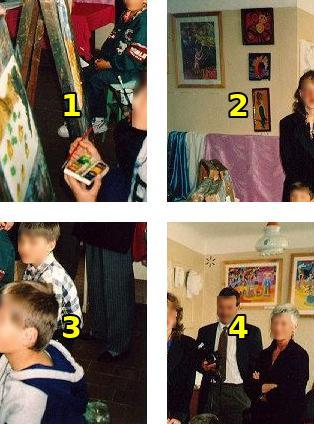

The image below is divided into four parts by white strips, forming a 2×2 jigsaw puzzle. The parts are labeled "1" (top-left), "2" (top-right), "3" (bottom-left), and "4" (bottom-right). These parts are from a single original image but have been shuffled. Your task is to determine the correct arrangement of the physically labeled parts to reconstruct the natural image.

Select the correct statement from the following choices:

(A) The top-left part should be Part 1; the top-right part should be Part 2; the bottom-left part should be Part 4; and the bottom-right part should be Part 3.
(B) The top-left part should be Part 1; the top-right part should be Part 3; the bottom-left part should be Part 4; and the bottom-right part should be Part 2.
(C) The top-left part should be Part 3; the top-right part should be Part 2; the bottom-left part should be Part 1; and the bottom-right part should be Part 4.
(D) The top-left part should be Part 2; the top-right part should be Part 4; the bottom-l

100%|██████████| 49/49 [00:23<00:00,  2.08it/s]


Round_0:
<think>To solve this 2×2 jigsaw puzzle, I begin by closely examining the visual content of each labeled part and considering how their features might connect naturally.

Part 1 (top-left in the shuffled grid): This piece shows an easel with painting on it, a hand holding a paint palette, and a child sitting in the background. The colors are mostly warm, and the left edge contains the side of the canvas, which appears to be part of the foreground. There is a visible green garment in the background, and the setting looks like an art room.

Part 2 (top-right in the shuffled grid): This piece features a wall with several framed artworks, a draped table with colorful cloth, and a woman standing to the right. The lighting is consistent with an indoor setting, and the wall color matches that of Part 1. The lower edge includes the head of a child, which may belong to another piece.

Part 3 (bottom-left in the shuffled grid): This part shows more children, one in a blue-and-white hoodi

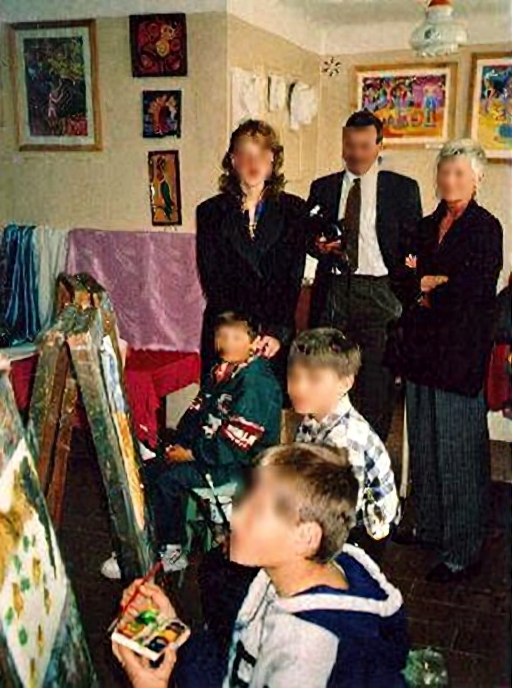

Round_1:
<image_end><think>To verify the correctness of the reconstructed image, I closely examine the assembled result for visual continuity, object alignment, and overall naturalness. The image now presents a coherent indoor art scene: the easel with the painting and the child holding the palette are positioned in the foreground bottom-left, seamlessly transitioning to a group of children and adults standing and sitting in the background. 

The boundaries between the previously separated pieces are now visually continuous. The easel aligns perfectly with the figures and the table in the background, with the painting and the child’s pose naturally integrated into the scene. The wall runs smoothly from the lower left to the upper parts, with the framed artworks and the draped table matching perfectly along the vertical axis. The colors and lighting remain consistent throughout, with no abrupt changes or mismatched edges. The arrangement of the adults and children is logical, with their

In [9]:

image = Image.open("test_images/Jigsaw_Assembly.jpg")
prompt = "The image below is divided into four parts by white strips, forming a 2\u00d72 jigsaw puzzle. The parts are labeled \"1\" (top-left), \"2\" (top-right), \"3\" (bottom-left), and \"4\" (bottom-right). These parts are from a single original image but have been shuffled. Your task is to determine the correct arrangement of the physically labeled parts to reconstruct the natural image.\n\nSelect the correct statement from the following choices:\n\n(A) The top-left part should be Part 1; the top-right part should be Part 2; the bottom-left part should be Part 4; and the bottom-right part should be Part 3.\n(B) The top-left part should be Part 1; the top-right part should be Part 3; the bottom-left part should be Part 4; and the bottom-right part should be Part 2.\n(C) The top-left part should be Part 3; the top-right part should be Part 2; the bottom-left part should be Part 1; and the bottom-right part should be Part 4.\n(D) The top-left part should be Part 2; the top-right part should be Part 4; the bottom-left part should be Part 1; and the bottom-right part should be Part 3."
display(image)
print(prompt)
print('-'*10)
output_list = inferencer(image=image, text=prompt, understanding_output=False, think=True, **inference_hyper)
text_round = 0

for idx, out_item in enumerate(output_list):
    if isinstance(out_item, str):
        out_item = f"Round_{text_round}:\n" + out_item
        text_round += 1
        print(out_item)
    elif isinstance(out_item, Image.Image):
        display(out_item)

## Visual Search

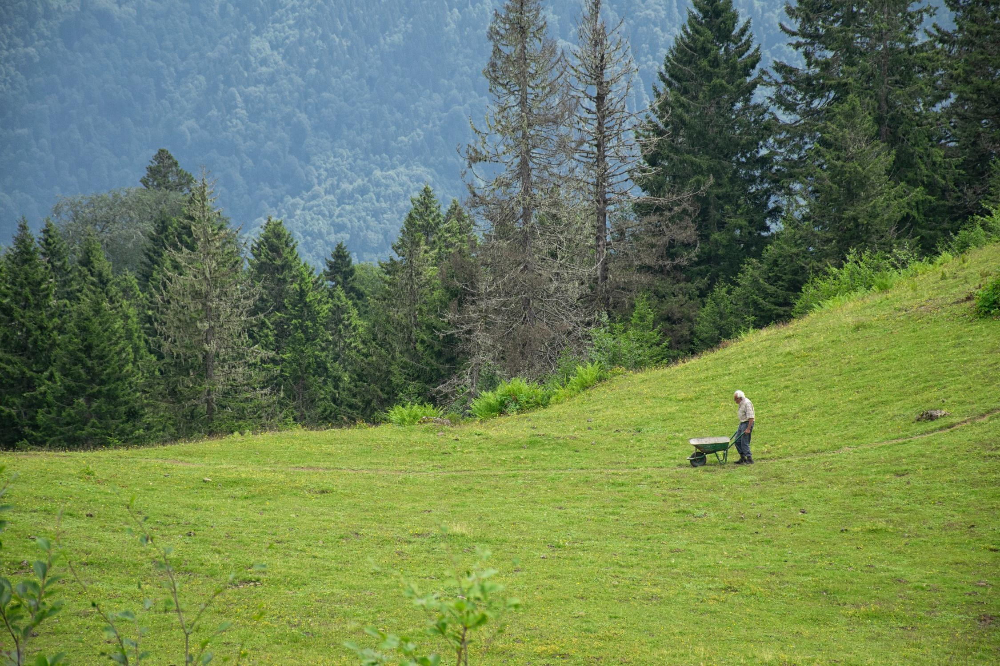

What is the color of the cart?
A: red
B: white
C: black
D: green
----------


100%|██████████| 49/49 [00:41<00:00,  1.17it/s]


Round_0:
<think>To determine the correct answer, start by scanning the image for any carts or wagons present. Focus on the middle-right section of the image, where there is a person standing next to a wheeled container with handles, which is characteristic of a cart. Next, observe the color of the cart itself. Look for visual cues such as the shape, size, and color contrast against the green grass and the person. Notice that the cart is positioned near the person, who appears to be interacting with it, and take note of its hue. After identifying the cart, you would draw a red bounding box around it to highlight the key object relevant to the color query.</think><image_start>


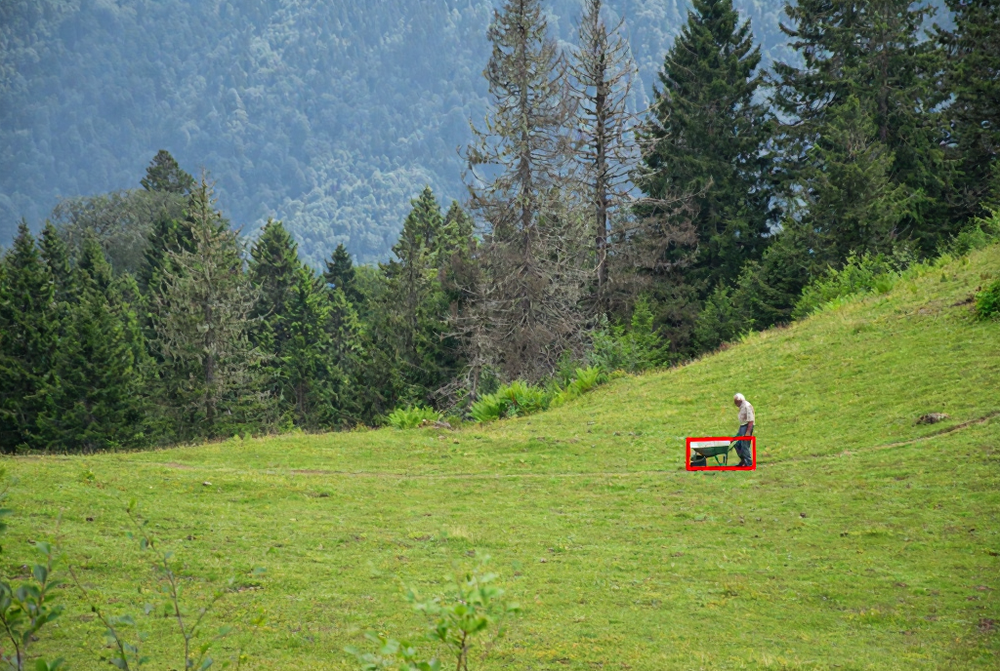

Round_1:
<image_end><think>With the cart now highlighted by the red bounding box, it becomes much easier to closely examine its color. The cart's body and frame are clearly visible inside the box, and they stand out as a shade of green that matches the surrounding grass in intensity and tone. There are no visible red, white, or black elements on the cart; it blends naturally with the environment and is distinctly green in color. By comparing this visual evidence to the answer choices, it is clear that the correct answer is D: green.</think><answer>D</answer>


In [28]:

image = Image.open("test_images/Visual_Search.jpg")
prompt = "What is the color of the cart?\nA: red\nB: white\nC: black\nD: green"
display(image)
print(prompt)
print('-'*10)
output_list = inferencer(image=image, text=prompt, understanding_output=False, think=True, **inference_hyper)
text_round = 0

for idx, out_item in enumerate(output_list):
    if isinstance(out_item, str):
        out_item = f"Round_{text_round}:\n" + out_item
        text_round += 1
        print(out_item)
    elif isinstance(out_item, Image.Image):
        display(out_item)

## Spatial Navigation

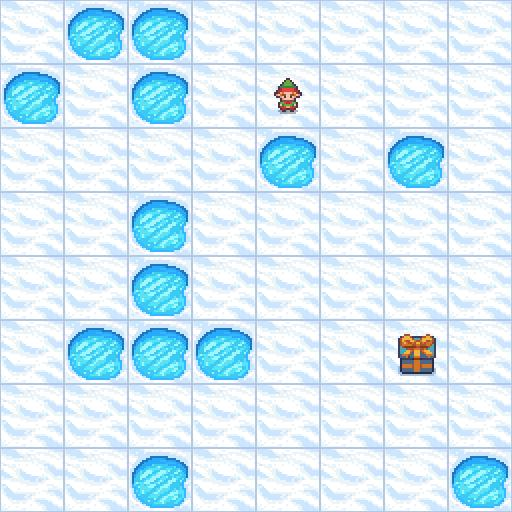

You are a maze solver. Your goal is to guide a player from the start to the goal on a grid map while avoiding holes. The player can move one square at a time in the directions left (L), right (R), up (U), or down (D). The frozen lake is not slippery; the player will always move in the intended direction. Moving off the edge or falling into a hole results in failure. Reaching the goal means success. Provide your solution as a sequence of moves wrapped inoxed{{}}, such asoxed{L,R,U,D}. The moves should be comma-separated.
----------


100%|██████████| 49/49 [00:20<00:00,  2.44it/s]


Round_0:
<think>To get a clear sense of the maze layout, I'll note the main features. The grid is 8 rows by 8 columns. The starting point is located in the second row from the top and the fifth column from the left. The goal, which looks like a present, is found in the sixth row from the top and the seventh column from the left.

Ice holes are scattered throughout the maze:
- The first row has holes in columns two and three.
- The second row contains holes in columns one and three.
- The third row has holes in columns five and eight.
- The fourth row features a hole in column three.
- The fifth row has holes in columns two, three, and four.
- The sixth row has holes in columns three and eight.
- The seventh row has holes in columns three and eight.
- The eighth row has a hole in column three.

With the positions of the starting square, the goal, and all the ice holes in mind, I can now move on to plotting the correct path through the maze.</think><image_start>


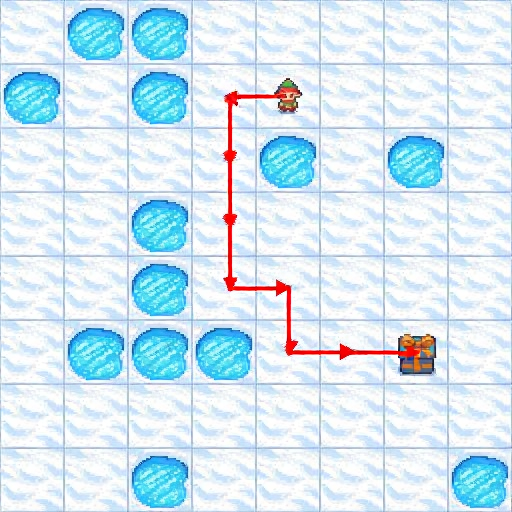

Round_1:
<image_end><think>Looking over my solution, I see that the path begins at the starting square in the second row and fifth column. The moves are as follows: left, up, up, up, right, down, right, right.

Let me verify each step:
- First move left: now at row 2, column 4.
- Next, up: row 1, column 4 (safe).
- Up: row 2, column 4 (safe).
- Up: row 3, column 4 (safe).
- Right: row 3, column 5 (safe).
- Down: row 4, column 5 (safe).
- Right: row 4, column 6 (safe).
- Right: row 4, column 7 (goal).

Every move lands on a frozen surface, avoiding all the ice holes. The path ends precisely at the goal. This confirms that my solution is correct.

So, the correct path is \boxed{L,U,U,U,R,D,R,R}.</think><answer>\boxed{L,U,U,U,R,D,R,R}</answer>


In [16]:

image = Image.open("test_images/Spatial_Navigation.jpg")
prompt = "You are a maze solver. Your goal is to guide a player from the start to the goal on a grid map while avoiding holes. The player can move one square at a time in the directions left (L), right (R), up (U), or down (D). The frozen lake is not slippery; the player will always move in the intended direction. Moving off the edge or falling into a hole results in failure. Reaching the goal means success. Provide your solution as a sequence of moves wrapped in \boxed{{}}, such as \boxed{L,R,U,D}. The moves should be comma-separated."
display(image)
print(prompt)
print('-'*10)
output_list = inferencer(image=image, text=prompt, understanding_output=False, think=True, **inference_hyper)
text_round = 0

for idx, out_item in enumerate(output_list):
    if isinstance(out_item, str):
        out_item = f"Round_{text_round}:\n" + out_item
        text_round += 1
        print(out_item)
    elif isinstance(out_item, Image.Image):
        display(out_item)